# Objetivo

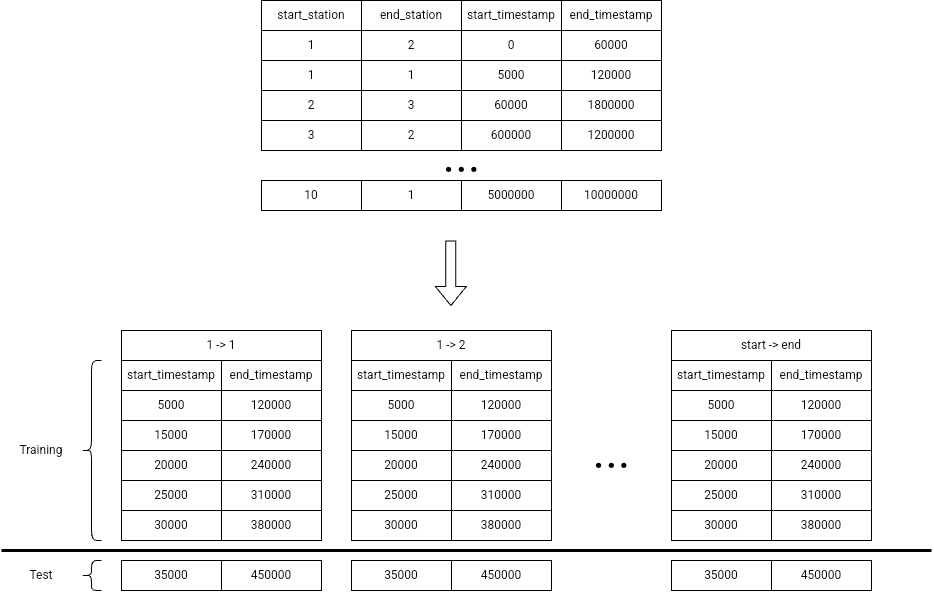

# 1. Configuração do Ambiente

Nesta seção, configuramos o ambiente de execução, realizamos a montagem do Google Drive (se necessário), importamos bibliotecas essenciais e definimos variáveis de configuração para garantir a reprodutibilidade dos experimentos.

## 1.1 Montagem do Google Drive
Montamos o Google Drive para acessar os arquivos diretamente da nuvem.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## 1.2 Imports
Importamos bibliotecas como `pandas`, `numpy`, `tensorflow`, `sklearn`, entre outras.

In [ ]:
# !sudo pip3 install keras

In [ ]:
import pandas as pd
import numpy as np
import tensorflow as tf
import re
import holidays
import os
import random

# from tensorflow import keras

from collections import Counter
from sklearn.cluster import KMeans
from sklearn.decomposition import TruncatedSVD
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.neural_network import MLPRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score
from sklearn.multioutput import MultiOutputRegressor

# from keras.models import Sequential
# from keras.layers import Dense, Dropout, BatchNormalization
# from keras.optimizers import Nadam


## 1.3 Configurações Globais
Definimos parâmetros como semente aleatória, tamanho de teste e caminhos para os arquivos.

In [ ]:
TEST_SIZE = 0.20
SEED = 42

In [ ]:
np.random.seed(SEED)
random.seed(SEED)
tf.random.set_seed(SEED)

In [ ]:
os.environ['TF_DETERMINISTIC_OPS'] = '1'
pd.set_option('display.max_columns', 7000)
pd.set_option('display.max_rows',90000)

# 2. Carregamento dos Dados

Nesta etapa, carregamos os dados brutos no formato `.csv`. Esses dados contêm registros detalhados de viagens (start time, end time, duração, etc.).

É importante garantir que todos os dados sejam lidos corretamente, sem perda de informações importantes.


In [ ]:
ROOT_PATH = "/content/drive/MyDrive/Bike4Real/"
TRIPS_PATH = f"{ROOT_PATH}data/trips.csv"
# STATIONS_PATH = "/content/drive/My Drive/Bike4Real/dados/stations.csv"

trips     = pd.read_csv(TRIPS_PATH,low_memory=False)
# stations_df  = pd.read_csv(STATIONS_PATH,low_memory=False)

# 3. Limpeza e Tratamento de Dados

Após carregar os dados, realizamos uma série de procedimentos para garantir sua qualidade e consistência.

In [ ]:
# stations_df.head()

In [ ]:
trips.head()

,STARTSTATIONNAME,STARTSTATIONARRONDISSEMENT,STARTSTATIONLATITUDE,STARTSTATIONLONGITUDE,ENDSTATIONNAME,ENDSTATIONARRONDISSEMENT,ENDSTATIONLATITUDE,ENDSTATIONLONGITUDE,STARTTIMEMS,ENDTIMEMS
0,Fabre / Laurier,Le Plateau-Mont-Royal,45.534587,-73.582599,St-Urbain / Laurier,Le Plateau-Mont-Royal,45.521646,-73.593668,1713974796005,1.713975e+12
1,de Chateaubriand / Jarry,Villeray—Saint-Michel—Parc-Extension,45.545887,-73.626737,de Chateaubriand / Jarry,Villeray—Saint-Michel—Parc-Extension,45.545887,-73.626737,1713974489288,1.713975e+12
2,Guy / Sainte-Catherine,Ville-Marie,45.494975,-73.577770,Peel / Notre-Dame,Ville-Marie,45.495447,-73.563294,1713975836565,1.713976e+12
3,Drolet / Marie-Anne,Le Plateau-Mont-Royal,45.522403,-73.581177,Clark / Laurier,Le Plateau-Mont-Royal,45.522584,-73.593613,1713955897344,1.713956e+12
4,de Maisonneuve / Greene,Westmount,45.486971,-73.589293,Lincoln / du Fort,Ville-Marie,45.493065,-73.583827,1713957684136,1.713958e+12


In [ ]:
trips.columns


Index(['STARTSTATIONNAME', 'STARTSTATIONARRONDISSEMENT',
       'STARTSTATIONLATITUDE', 'STARTSTATIONLONGITUDE', 'ENDSTATIONNAME',
       'ENDSTATIONARRONDISSEMENT', 'ENDSTATIONLATITUDE', 'ENDSTATIONLONGITUDE',
       'STARTTIMEMS', 'ENDTIMEMS'],
      dtype='object')

## 4.1 Verificação de dados ausentes
Identificação e tratamento de valores nulos, se houver.

As colunas STARTSTATIONARRONDISSEMENT, STARTSTATIONLATITUDE, STARTSTATIONLONGITUDE, ENDSTATIONARRONDISSEMENT, ENDSTATIONLATITUDE,ENDSTATIONLONGITUDE não serão uteis, **portanto serão removidas**

In [ ]:
trips = trips.drop(columns=['STARTSTATIONARRONDISSEMENT', 'STARTSTATIONLATITUDE', 'STARTSTATIONLONGITUDE', 'ENDSTATIONARRONDISSEMENT', 'ENDSTATIONLATITUDE','ENDSTATIONLONGITUDE'])

In [ ]:
trips.head()

,STARTSTATIONNAME,ENDSTATIONNAME,STARTTIMEMS,ENDTIMEMS
0,Fabre / Laurier,St-Urbain / Laurier,1713974796005,1.713975e+12
1,de Chateaubriand / Jarry,de Chateaubriand / Jarry,1713974489288,1.713975e+12
2,Guy / Sainte-Catherine,Peel / Notre-Dame,1713975836565,1.713976e+12
3,Drolet / Marie-Anne,Clark / Laurier,1713955897344,1.713956e+12
4,de Maisonneuve / Greene,Lincoln / du Fort,1713957684136,1.713958e+12


## 4.2 Conversão de colunas de data/hora
Transformação de strings em objetos `datetime` para facilitar extrações futuras.

In [ ]:
# Create a mapping from station names to numerical IDs
station_mapping = {station: idx for idx, station in enumerate(trips['STARTSTATIONNAME'].unique())}

# Apply the mapping to the 'STARTSTATION' and 'ENDSTATION' columns
trips['STARTSTATION'] = trips['STARTSTATIONNAME'].map(station_mapping).astype(float)
trips['ENDSTATION'] = trips['ENDSTATIONNAME'].map(station_mapping).astype(float)


# Display the updated DataFrame
trips.head()

,STARTSTATIONNAME,ENDSTATIONNAME,STARTTIMEMS,ENDTIMEMS,STARTSTATION,ENDSTATION
0,Fabre / Laurier,St-Urbain / Laurier,1713974796005,1.713975e+12,0.0,267.0
1,de Chateaubriand / Jarry,de Chateaubriand / Jarry,1713974489288,1.713975e+12,1.0,1.0
2,Guy / Sainte-Catherine,Peel / Notre-Dame,1713975836565,1.713976e+12,2.0,155.0
3,Drolet / Marie-Anne,Clark / Laurier,1713955897344,1.713956e+12,3.0,356.0
4,de Maisonneuve / Greene,Lincoln / du Fort,1713957684136,1.713958e+12,4.0,426.0


In [ ]:
mapped_trips = trips.drop(columns=['STARTSTATIONNAME',	'ENDSTATIONNAME'])
mapped_trips.head()

,STARTTIMEMS,ENDTIMEMS,STARTSTATION,ENDSTATION
0,1713974796005,1.713975e+12,0.0,267.0
1,1713974489288,1.713975e+12,1.0,1.0
2,1713975836565,1.713976e+12,2.0,155.0
3,1713955897344,1.713956e+12,3.0,356.0
4,1713957684136,1.713958e+12,4.0,426.0


In [ ]:
mapped_trips.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2698419 entries, 0 to 2698418
Data columns (total 4 columns):
 #   Column        Dtype  
---  ------        -----  
 0   STARTTIMEMS   int64  
 1   ENDTIMEMS     float64
 2   STARTSTATION  float64
 3   ENDSTATION    float64
dtypes: float64(3), int64(1)
memory usage: 82.3 MB


In [ ]:
mapped_trips = mapped_trips.dropna()

In [ ]:
mapped_trips.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2685356 entries, 0 to 2698418
Data columns (total 4 columns):
 #   Column        Dtype  
---  ------        -----  
 0   STARTTIMEMS   int64  
 1   ENDTIMEMS     float64
 2   STARTSTATION  float64
 3   ENDSTATION    float64
dtypes: float64(3), int64(1)
memory usage: 102.4 MB


# 4. Engenharia de Atributos

Criamos novas colunas a partir das informações existentes para enriquecer o conjunto de dados e torná-lo mais informativo para os modelos.


## 4.1 Agrupar viagens
Nesta etapa agrupamos dados por pares de estações, transformamos colunas e filtramos pares com poucas ocorrências para reduzir ruído.

In [ ]:
poc_mapped_trips = mapped_trips#.head(1000000)

In [ ]:
poc_mapped_trips.head()

,STARTTIMEMS,ENDTIMEMS,STARTSTATION,ENDSTATION
0,1713974796005,1.713975e+12,0.0,267.0
1,1713974489288,1.713975e+12,1.0,1.0
2,1713975836565,1.713976e+12,2.0,155.0
3,1713955897344,1.713956e+12,3.0,356.0
4,1713957684136,1.713958e+12,4.0,426.0


In [ ]:
poc_mapped_trips.describe()

,STARTTIMEMS,ENDTIMEMS,STARTSTATION,ENDSTATION
count,2.685356e+06,2.685356e+06,2.685356e+06,2.685356e+06
mean,1.714667e+12,1.714669e+12,2.958816e+02,2.978222e+02
std,2.352864e+09,2.352801e+09,2.043651e+02,2.045279e+02
min,1.704085e+12,1.704085e+12,0.000000e+00,0.000000e+00
25%,1.713790e+12,1.713791e+12,1.280000e+02,1.320000e+02
50%,1.715287e+12,1.715288e+12,2.650000e+02,2.690000e+02
75%,1.716292e+12,1.716293e+12,4.370000e+02,4.380000e+02
max,1.717214e+12,1.717859e+12,8.980000e+02,8.980000e+02


In [ ]:
# Create the 'STATION_PAIR' column
poc_mapped_trips.loc[:, 'STATION_PAIR'] = poc_mapped_trips.apply(lambda row: f"{row['STARTSTATION']}-{row['ENDSTATION']}", axis=1)

In [ ]:
poc_mapped_trips.head(10)

,STARTTIMEMS,ENDTIMEMS,STARTSTATION,ENDSTATION,STATION_PAIR
0,1713974796005,1.713975e+12,0.0,267.0,0.0-267.0
1,1713974489288,1.713975e+12,1.0,1.0,1.0-1.0
2,1713975836565,1.713976e+12,2.0,155.0,2.0-155.0
3,1713955897344,1.713956e+12,3.0,356.0,3.0-356.0
4,1713957684136,1.713958e+12,4.0,426.0,4.0-426.0
5,1713968641684,1.713969e+12,5.0,11.0,5.0-11.0
6,1713974610745,1.713975e+12,6.0,608.0,6.0-608.0
7,1713962128532,1.713963e+12,7.0,32.0,7.0-32.0
8,1713974435847,1.713975e+12,8.0,125.0,8.0-125.0
9,1713959817325,1.713960e+12,4.0,401.0,4.0-401.0


In [ ]:
STATION_PAIR_ids = poc_mapped_trips['STATION_PAIR'].unique()
STATION_PAIR_ids[:10]

array(['0.0-267.0', '1.0-1.0', '2.0-155.0', '3.0-356.0', '4.0-426.0',
       '5.0-11.0', '6.0-608.0', '7.0-32.0', '8.0-125.0', '4.0-401.0'],
      dtype=object)

In [ ]:
station_pair_counts = poc_mapped_trips['STATION_PAIR'].value_counts()
station_pair_counts

,count
STATION_PAIR,
619.0-619.0,2926
199.0-249.0,1301
668.0-668.0,1206
70.0-70.0,980
104.0-51.0,965
...,...
231.0-441.0,1
63.0-55.0,1
379.0-463.0,1


In [ ]:
# Filter out rows where 'STATION_PAIR' count is less than 11
station_pair_counts = poc_mapped_trips['STATION_PAIR'].value_counts()
station_pairs_to_keep = station_pair_counts[station_pair_counts >= 11].index
poc_mapped_trips = poc_mapped_trips[poc_mapped_trips['STATION_PAIR'].isin(station_pairs_to_keep)]

In [ ]:
poc_mapped_trips

,STARTTIMEMS,ENDTIMEMS,STARTSTATION,ENDSTATION,STATION_PAIR
1,1713974489288,1.713975e+12,1.0,1.0,1.0-1.0
2,1713975836565,1.713976e+12,2.0,155.0,2.0-155.0
3,1713955897344,1.713956e+12,3.0,356.0,3.0-356.0
4,1713957684136,1.713958e+12,4.0,426.0,4.0-426.0
6,1713974610745,1.713975e+12,6.0,608.0,6.0-608.0
...,...,...,...,...,...
2698411,1717211576829,1.717212e+12,232.0,173.0,232.0-173.0
2698413,1717179509579,1.717181e+12,231.0,621.0,231.0-621.0
2698414,1717201295379,1.717202e+12,230.0,586.0,230.0-586.0
2698415,1717186391567,1.717187e+12,227.0,143.0,227.0-143.0


In [ ]:
station_pair_counts = poc_mapped_trips['STATION_PAIR'].value_counts()
station_pair_counts

,count
STATION_PAIR,
619.0-619.0,2926
199.0-249.0,1301
668.0-668.0,1206
70.0-70.0,980
104.0-51.0,965
290.0-95.0,951
249.0-199.0,925
262.0-167.0,921
95.0-290.0,897


In [ ]:
import numpy as np

def group_trips_for_prediction(df, input_size=5, label_size=1):
    """
    Groups trips by STATION_PAIR_id into sequences where:
    - Each input has shape (n, input_size, 4) representing consecutive trips
    - Each label has shape (n, label_size, 4) representing the next trip(s)

    Parameters:
        df (pd.DataFrame): DataFrame contendo as viagens.
        input_size (int): Número de viagens consecutivas para o input.
        label_size (int): Número de viagens para o label (próxima(s) viagem(ns)).

    Returns:
        X: Input sequences (consecutive trips)
        y: Target sequences (next trip(s))
    """
    # Listas para armazenar inputs e labels
    all_X = []
    all_y = []

    # Use groupby para processar cada grupo uma única vez
    grouped = df.groupby('STATION_PAIR')

    for _, station_data in grouped:
        # Ordene os dados por STARTTIMEMS para garantir sequência temporal
        station_data_sorted = station_data.sort_values(by='STARTTIMEMS')

        # Selecione apenas as primeiras 4 colunas após ordenação
        trip_data = station_data_sorted.iloc[:, :4].values

        # Precisamos de pelo menos 'input_size' + 'label_size' viagens para criar um exemplo
        num_trips = len(trip_data)

        if num_trips < input_size + label_size:
            continue  # Pule grupos com menos viagens que o necessário

        # Crie janelas deslizantes de viagens para input e label
        for i in range(num_trips - input_size - label_size + 1):
            # 'input_size' viagens consecutivas para input
            X_window = trip_data[i:i+input_size]
            # Próximas 'label_size' viagens para o label
            y_window = trip_data[i+input_size:i+input_size+label_size]

            all_X.append(X_window)
            all_y.append(y_window)

    # Converta para arrays numpy
    X = np.array(all_X)
    y = np.array(all_y)

    return X, y


In [ ]:
# grouped_data = group_trips_for_prediction(poc_mapped_trips, input_size=10, label_size=1)
# X = grouped_data[0]
# y = grouped_data[1]

In [ ]:
# X, X.shape

In [ ]:
# y, y.shape

In [ ]:
import pickle

# Save the grouped_data variable to a .pkl file
# with open(f'{ROOT_PATH}data/X.pkl', 'wb') as file:
#     pickle.dump(X, file)

# with open(f'{ROOT_PATH}data/y.pkl', 'wb') as file:
#     pickle.dump(y, file)

## 4.2 Conversão de timestamp para features
Convertendo campos de data/hora em colunas como ano, mês, dia, hora e minuto para permitir análises temporais mais refinadas.

In [ ]:
# prompt: passe os dois primeiros campos de poc_mapped_trips  de timesamp para ano, mes, dia, hora e minuto, devem ser criadas colunas para os novos campos do tipo float, faça isso em uma copia dos dados

import pandas as pd

# Assuming poc_mapped_trips is already defined from the previous code

# Create a copy to avoid modifying the original DataFrame
poc_mapped_trips_copy = poc_mapped_trips.copy()

# Convert the first two timestamp columns to datetime objects
for col in ['STARTTIMEMS', 'ENDTIMEMS']:
    poc_mapped_trips_copy[col] = pd.to_datetime(poc_mapped_trips_copy[col], unit='ms')

# Extract year, month, day, hour, and minute
for col in ['STARTTIMEMS', 'ENDTIMEMS']:
    poc_mapped_trips_copy[f'{col}_year'] = poc_mapped_trips_copy[col].dt.year.astype(float)
    poc_mapped_trips_copy[f'{col}_month'] = poc_mapped_trips_copy[col].dt.month.astype(float)
    poc_mapped_trips_copy[f'{col}_day'] = poc_mapped_trips_copy[col].dt.day.astype(float)
    poc_mapped_trips_copy[f'{col}_hour'] = poc_mapped_trips_copy[col].dt.hour.astype(float)
    poc_mapped_trips_copy[f'{col}_minute'] = poc_mapped_trips_copy[col].dt.minute.astype(float)

# Display the updated DataFrame (optional)
poc_mapped_trips_copy.head()


,STARTTIMEMS,ENDTIMEMS,STARTSTATION,ENDSTATION,STATION_PAIR,STARTTIMEMS_year,STARTTIMEMS_month,STARTTIMEMS_day,STARTTIMEMS_hour,STARTTIMEMS_minute,ENDTIMEMS_year,ENDTIMEMS_month,ENDTIMEMS_day,ENDTIMEMS_hour,ENDTIMEMS_minute
1,2024-04-24 16:01:29.288,2024-04-24 16:01:50.449,1.0,1.0,1.0-1.0,2024.0,4.0,24.0,16.0,1.0,2024.0,4.0,24.0,16.0,1.0
2,2024-04-24 16:23:56.565,2024-04-24 16:29:40.349,2.0,155.0,2.0-155.0,2024.0,4.0,24.0,16.0,23.0,2024.0,4.0,24.0,16.0,29.0
3,2024-04-24 10:51:37.344,2024-04-24 11:00:16.330,3.0,356.0,3.0-356.0,2024.0,4.0,24.0,10.0,51.0,2024.0,4.0,24.0,11.0,0.0
4,2024-04-24 11:21:24.136,2024-04-24 11:25:43.141,4.0,426.0,4.0-426.0,2024.0,4.0,24.0,11.0,21.0,2024.0,4.0,24.0,11.0,25.0
6,2024-04-24 16:03:30.745,2024-04-24 16:10:00.904,6.0,608.0,6.0-608.0,2024.0,4.0,24.0,16.0,3.0,2024.0,4.0,24.0,16.0,10.0


In [ ]:
poc_mapped_trips_copy.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1996677 entries, 1 to 2698418
Data columns (total 15 columns):
 #   Column              Dtype         
---  ------              -----         
 0   STARTTIMEMS         datetime64[ns]
 1   ENDTIMEMS           datetime64[ns]
 2   STARTSTATION        float64       
 3   ENDSTATION          float64       
 4   STATION_PAIR        object        
 5   STARTTIMEMS_year    float64       
 6   STARTTIMEMS_month   float64       
 7   STARTTIMEMS_day     float64       
 8   STARTTIMEMS_hour    float64       
 9   STARTTIMEMS_minute  float64       
 10  ENDTIMEMS_year      float64       
 11  ENDTIMEMS_month     float64       
 12  ENDTIMEMS_day       float64       
 13  ENDTIMEMS_hour      float64       
 14  ENDTIMEMS_minute    float64       
dtypes: datetime64[ns](2), float64(12), object(1)
memory usage: 243.7+ MB


In [ ]:
import numpy as np

def group_trips_for_prediction_hour_minute(df, input_size=5, label_size=1):
    """
    Groups trips by STATION_PAIR_id into sequences where:
    - Each input has shape (n, input_size, 4) representing consecutive trips
    - Each label has shape (n, label_size, 4) representing the next trip(s)

    Parameters:
        df (pd.DataFrame): DataFrame contendo as viagens.
        input_size (int): Número de viagens consecutivas para o input.
        label_size (int): Número de viagens para o label (próxima(s) viagem(ns)).

    Returns:
        X: Input sequences (consecutive trips)
        y: Target sequences (next trip(s))
    """
    # Listas para armazenar inputs e labels
    all_X = []
    all_y = []

    # Use groupby para processar cada grupo uma única vez
    grouped = df.groupby('STATION_PAIR')

    for _, station_data in grouped:
        # Ordene os dados por STARTTIMEMS para garantir sequência temporal
        station_data_sorted = station_data.sort_values(by='STARTTIMEMS')

        station_data_sorted.drop(columns=['STARTTIMEMS', 'ENDTIMEMS', 'STATION_PAIR'], inplace=True)

        # Selecione apenas as primeiras 4 colunas após ordenação
        trip_data = station_data_sorted.iloc[:, :].values
        # print(trip_data.shape)

        # Precisamos de pelo menos 'input_size' + 'label_size' viagens para criar um exemplo
        num_trips = len(trip_data)

        if num_trips < input_size + label_size:
            continue  # Pule grupos com menos viagens que o necessário

        # Crie janelas deslizantes de viagens para input e label
        for i in range(num_trips - input_size - label_size + 1):
            # 'input_size' viagens consecutivas para input
            X_window = trip_data[i:i+input_size]
            # Próximas 'label_size' viagens para o label
            y_window = trip_data[i+input_size:i+input_size+label_size]

            all_X.append(X_window)
            all_y.append(y_window)

    # Converta para arrays numpy
    X = np.array(all_X)
    y = np.array(all_y)

    return X, y


# 5. Preparação Final e Salvamento

Com os dados já limpos e enriquecidos, realizamos os últimos ajustes para alimentar os modelos:

- Separação entre X (features) e y (alvo)
- Salvamento dos arrays prontos em arquivos `.pkl` para facilitar a reutilização nos experimentos


In [ ]:
grouped_data_cp = group_trips_for_prediction_hour_minute(poc_mapped_trips_copy, input_size=10, label_size=1)

In [ ]:
X_cp = grouped_data_cp[0]
y_cp = grouped_data_cp[1]

In [ ]:
X_cp.shape, y_cp.shape

((1390777, 10, 12), (1390777, 1, 12))

In [ ]:
# Save the grouped_data variable to a .pkl file
with open(f'{ROOT_PATH}data/X_cp.pkl', 'wb') as file:
    pickle.dump(X_cp, file)

with open(f'{ROOT_PATH}data/y_cp.pkl', 'wb') as file:
    pickle.dump(y_cp, file)

# 6. Conclusão

Finalizamos o pré-processamento dos dados com sucesso. O resultado é um conjunto limpo e pronto para ser utilizado em modelos sequenciais.

Na próxima etapa do projeto, vamos aplicar arquiteturas como LSTM e Transformer para prever comportamentos com base nos dados processados aqui.
